# Melbourne housing rate analysis and prediction

### Firstly, we read the dataset and look at the features we will analyse.

In [17]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import geopandas
import json
from IPython.core.display import HTML
import plotly.offline as offline
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import warnings   # remove all warnings from the output

warnings.filterwarnings("ignore")

# Set notebook mode to work in offline
offline.init_notebook_mode()

%matplotlib inline

pd.set_option('display.max_colwidth',-1)
#avoid scientific enumeration output
np.set_printoptions(suppress=True)

In [18]:
# read house price data file
df_house=pd.read_csv('melb_data.csv')
df_house.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [19]:
df_house.describe(include = "all")

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
count,13580,13580,13580.000000,13580,1.358000e+04,13580,13580,13580,13580.000000,13580.000000,...,13580.000000,13518.000000,13580.000000,7130.000000,8205.000000,12211,13580.000000,13580.000000,13580,13580.000000
unique,314,13378,NaN,3,NaN,5,268,58,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,33,NaN,NaN,8,NaN
top,Reservoir,5 Charles St,NaN,h,NaN,S,Nelson,27/05/2017,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Moreland,NaN,NaN,Southern Metropolitan,NaN
freq,359,3,NaN,9449,NaN,9022,1565,473,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1163,NaN,NaN,4695,NaN
mean,NaN,NaN,2.937997,NaN,1.075684e+06,NaN,NaN,NaN,10.137776,3105.301915,...,1.534242,1.610075,558.416127,151.967650,1964.684217,NaN,-37.809203,144.995216,NaN,7454.417378
std,NaN,NaN,0.955748,NaN,6.393107e+05,NaN,NaN,NaN,5.868725,90.676964,...,0.691712,0.962634,3990.669241,541.014538,37.273762,NaN,0.079260,0.103916,NaN,4378.581772
min,NaN,NaN,1.000000,NaN,8.500000e+04,NaN,NaN,NaN,0.000000,3000.000000,...,0.000000,0.000000,0.000000,0.000000,1196.000000,NaN,-38.182550,144.431810,NaN,249.000000
25%,NaN,NaN,2.000000,NaN,6.500000e+05,NaN,NaN,NaN,6.100000,3044.000000,...,1.000000,1.000000,177.000000,93.000000,1940.000000,NaN,-37.856822,144.929600,NaN,4380.000000
50%,NaN,NaN,3.000000,NaN,9.030000e+05,NaN,NaN,NaN,9.200000,3084.000000,...,1.000000,2.000000,440.000000,126.000000,1970.000000,NaN,-37.802355,145.000100,NaN,6555.000000
75%,NaN,NaN,3.000000,NaN,1.330000e+06,NaN,NaN,NaN,13.000000,3148.000000,...,2.000000,2.000000,651.000000,174.000000,1999.000000,NaN,-37.756400,145.058305,NaN,10331.000000


In [20]:
df_house.shape

(13580, 21)

In [21]:
df_house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
Suburb           13580 non-null object
Address          13580 non-null object
Rooms            13580 non-null int64
Type             13580 non-null object
Price            13580 non-null float64
Method           13580 non-null object
SellerG          13580 non-null object
Date             13580 non-null object
Distance         13580 non-null float64
Postcode         13580 non-null float64
Bedroom2         13580 non-null float64
Bathroom         13580 non-null float64
Car              13518 non-null float64
Landsize         13580 non-null float64
BuildingArea     7130 non-null float64
YearBuilt        8205 non-null float64
CouncilArea      12211 non-null object
Lattitude        13580 non-null float64
Longtitude       13580 non-null float64
Regionname       13580 non-null object
Propertycount    13580 non-null float64
dtypes: float64(12), int64(1), object(8)
memory usage: 2.2+ MB


- house location info : suburb,address,postcode,councilarea, lattitude,longtitude,regionname
- house quality:rooms,type,bedroom2,bathroom,car,landsize,building area,yearbuilt
- sell and buy:price, method, sellerg,date
- unknown: distance, propertycount

## In todays' case, we use analyse this data from a few perspectives:


### 1.the relationship between time and price in melbourne
### 2.different types of real estates' selling trendency
### 3.whether agencies will affect the selling price.

> what kind of houses in Melbourne is most popular/sold best?
> what features will mostly affect Melbourne's housing rate?/Will sellerG affect the prices of houses?
> what the trendency of housing rate looks like in Melbourne?
> which places & type of house will be worthy investing in Melbourne in the future 10 years?

## Data preprocessing


## - Identifying columns not essential for analysing and deleting -

### Rooms

rooms should be related to bedroom2 and bathroom,while the num of rooms should be more than that of bedrooms.

In [22]:
df_house[['Rooms','Bedroom2','Bathroom']].head()

,Rooms,Bedroom2,Bathroom
0,2,2.0,1.0
1,2,2.0,1.0
2,3,3.0,2.0
3,3,3.0,2.0
4,4,3.0,1.0


In [23]:
#pick out the num of rooms is smaller than that of bedrooms.
error_rooms=df_house[df_house['Rooms']<df_house['Bedroom2']]
error_room_percentage = (error_rooms.shape[0]/df_house.shape[0])*100
error_room_percentage

1.4948453608247423

In [24]:
# As the percentage about data where the num of rooms is smaller than that of bedrooms is only 1.5%, to prevent this error affect the following analysis, I will choose to delete it.
house=df_house.copy()
house.drop(error_rooms.index,inplace=True)

In [25]:
house.shape

(13377, 21)

### Method & Distance & Propertycount

#### Method means the way to sell house, this analysis will focus on the features affecting prices and tendency of prices. Technically, method won't the most significant cause to price tendency. Distance is one column that is not related to the price.Thus I will choose to drop these two coloumns.

In [26]:
house.drop(['Method','Distance','Propertycount'],axis=1,inplace=True)

In [27]:
house.shape

(13377, 18)

### BuildingArea

### Building area is releated to Landszie based on the type of home(house),
#### For example, 
1. Example 1:
   > LCR of a standard home.<br>
   Building = 200 m2<br>
   Land = 400 m2<br>
   LCR = 2:1 or 200%.<br>
This is good; the land is double the building size.
2. Example 2:
    > LCR of a standard apartment.<br>
    Apartment building = 10,000 m2 <br>
    Land = 1,000 m2 <br>
    LCR = 1:10 or 10%.<br>
This is bad; the land is only a small fraction of the building size.


**_'Land appreciates, buildings depreciate'_**  [1]

[1]: https://www.yourinvestmentpropertymag.com.au/expert-advice/cam-mclellan/land-vs-building-200528.aspx

#### However, the proportion between land size and building area is flexible and cannot be inferred. On this dataset analysis, I will choose to drop buildingarea column and study with landsize and type of home. 

In [28]:
#calculate null percentage
def null(df, feature, plot=False):
    t = df[feature].isna().mean() * 100
    print(f'% of null: {t}%')
    if plot:
        sns.countplot(df[feature], palette='Set3')

In [29]:
null(house,'BuildingArea')

% of null: 47.41720864169844%


In [30]:
house.drop('BuildingArea',axis=1,inplace=True)

## - Identifying other columns with full value whether having logical,data type .etc. errors and handling -

### Price

In [31]:
#As the price number is too long, I will shorten it，based on price column describe
house['Price'] = house['Price']/1000000

In [32]:
house.rename(columns={'Price':'Price(Million)'},inplace=True)

In [33]:
house.head()

,Suburb,Address,Rooms,Type,Price(Million),SellerG,Date,Postcode,Bedroom2,Bathroom,Car,Landsize,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname
0,Abbotsford,85 Turner St,2,h,1.480,Biggin,3/12/2016,3067.0,2.0,1.0,1.0,202.0,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan
1,Abbotsford,25 Bloomburg St,2,h,1.035,Biggin,4/02/2016,3067.0,2.0,1.0,0.0,156.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan
2,Abbotsford,5 Charles St,3,h,1.465,Biggin,4/03/2017,3067.0,3.0,2.0,0.0,134.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan
3,Abbotsford,40 Federation La,3,h,0.850,Biggin,4/03/2017,3067.0,3.0,2.0,1.0,94.0,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan
4,Abbotsford,55a Park St,4,h,1.600,Nelson,4/06/2016,3067.0,3.0,1.0,2.0,120.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan


[Text(0, 0.5, 'Price-Milliom'), [], Text(0.5, 0, 'Housing Price')]

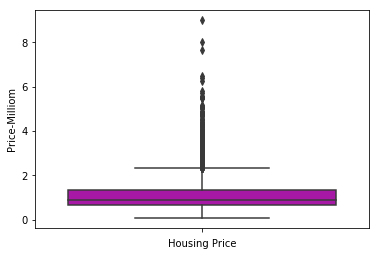

In [34]:
ax= sns.boxplot(palette=["m"],
            data=house['Price(Million)'])
ax.set(xlabel='Housing Price',ylabel='Price-Milliom',xticklabels=[])

### From price distribution, we can find the difference between prices of different houses are big, so we need to find which features will affect prices, why there will be outliers.

### Suburb

In [35]:
def funnel_plot(df,col,top):
    # pick out the top ten features of one column with the biggest amount of real estates, and other features will be integrated into one feature named 'others'
    data =df[col].value_counts().head(top)
    others=df[~df[col].isin(data.index)][col].shape[0]
    data_toframe = data.to_frame(name='Count') #convert picked-out series transferred into dataframe 
    
    # build a new series, convert index into one new column, adding to last dataframe, easy for drawing funnel plotly
    new_row=pd.Series(others,index=['Count'],name='Others') #index is new column name set,name is related index
    new_frame = data_toframe.append(new_row,ignore_index=False).sort_values(by='Count',ascending=False).reset_index()
    new_frame.rename(columns={'index':col},inplace=True)
    
    # graph_objects trace go.Funnel 
    fig = go.Figure(go.Funnel(
             y=new_frame[col].values,
             x=new_frame['Count'].values,
             textposition = "inside",
             textinfo = "value+percent total"
            )           
        )

    fig.show()

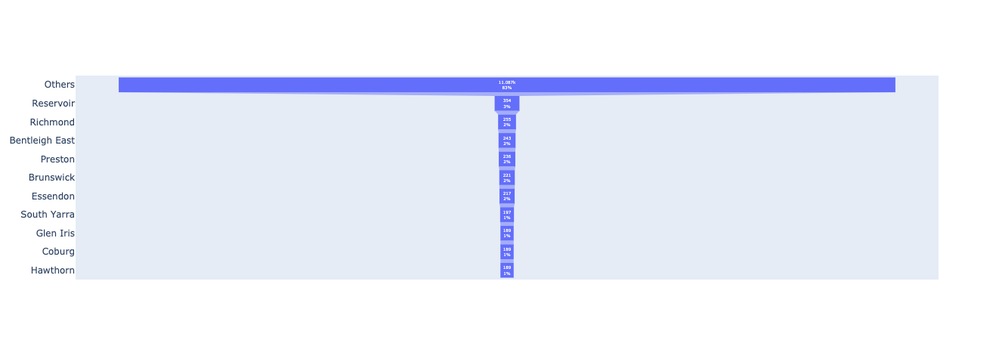

In [36]:
funnel_plot(house,'Suburb',10)

In [37]:
# fig = px.funnel(suburb, x='Count', y='Suburb')
# fig.show()

In [38]:
# sns.barplot(x=data.index,y='Count',data =data.to_frame(name='Count'), palette='Set3')

# use pie chart to visualize suburb distribution
# suburb.plot.pie(y = 'Count',autopct="%.1f%%",figsize=(15, 15))

### Type

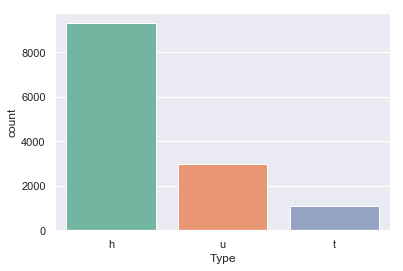

In [39]:
sns.set_theme(style="darkgrid")
sns.countplot(house['Type'], palette='Set2')

> - h = House
> - u = Unit
> - t = Toll

### SellerG

### SellerG columns will stand for names of different real estate agencies

In [40]:
house.head()

,Suburb,Address,Rooms,Type,Price(Million),SellerG,Date,Postcode,Bedroom2,Bathroom,Car,Landsize,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname
0,Abbotsford,85 Turner St,2,h,1.480,Biggin,3/12/2016,3067.0,2.0,1.0,1.0,202.0,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan
1,Abbotsford,25 Bloomburg St,2,h,1.035,Biggin,4/02/2016,3067.0,2.0,1.0,0.0,156.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan
2,Abbotsford,5 Charles St,3,h,1.465,Biggin,4/03/2017,3067.0,3.0,2.0,0.0,134.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan
3,Abbotsford,40 Federation La,3,h,0.850,Biggin,4/03/2017,3067.0,3.0,2.0,1.0,94.0,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan
4,Abbotsford,55a Park St,4,h,1.600,Nelson,4/06/2016,3067.0,3.0,1.0,2.0,120.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan


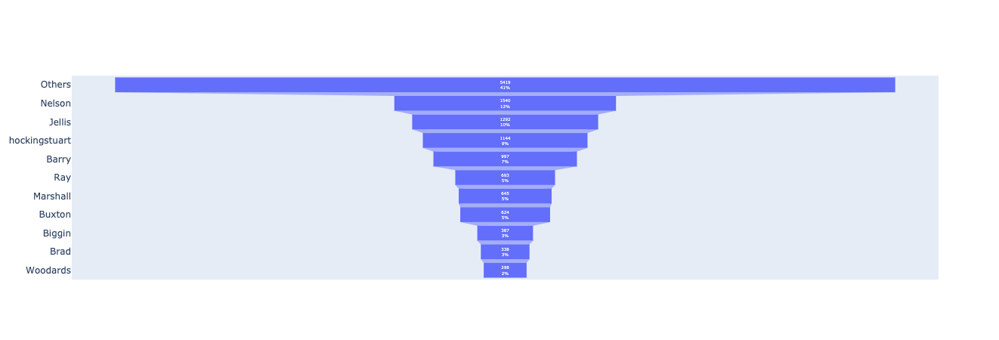

In [41]:
# We firstly use pie chart to show the distribution, mainly focus on top 10
# data_sell=df_house['SellerG'].value_counts().head(10)
# data_sell.to_frame(name='SellerG')
# data_sell.plot.pie(autopct="%.1f%%",figsize=(10, 10))
funnel_plot(house,'SellerG',10)

### <font size=3 color=#ff0000>will analyse each realestate angency selling price tendency </font>

### Date
#### Date means the date of selling the house

In [42]:
# To tell the format of date column is consistent
m1 = house['Date'].eq('') | house['Date'].isna()
m2 = pd.to_datetime(house['Date'],format='%d/%m/%Y',errors='coerce').isna()

m1.eq(m2).all()

True

### Postcode

#### postcode data type should be int,not float

In [43]:
house['Postcode'].dtypes

dtype('float64')

In [44]:
house['Postcode'] = house['Postcode'].astype('int')

## - Identifying missing value and handling -

In [45]:
house.isnull().sum(axis=0)

Suburb            0   
Address           0   
Rooms             0   
Type              0   
Price(Million)    0   
SellerG           0   
Date              0   
Postcode          0   
Bedroom2          0   
Bathroom          0   
Car               62  
Landsize          0   
YearBuilt         5292
CouncilArea       1367
Lattitude         0   
Longtitude        0   
Regionname        0   
dtype: int64

## Car 

% of null: 0.46348209613515734%


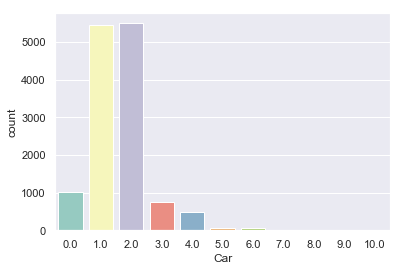

In [46]:
null(house,'Car',True)

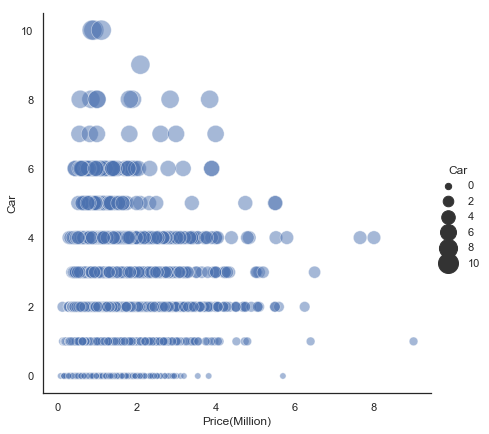

In [47]:
#find car and price relationship to decide how to deal with null value
sns.set_theme(style="white")


# Plot miles per gallon against horsepower with other semantics
sns.relplot(x="Price(Million)", y="Car", size="Car",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=6, data=house)

In [48]:
# house['Car'].value_counts().to_dict().keys()

### As the null percentage is quite low, and only from the scatterplot above, the relationship between price and car sapce is not directly correlated, so I just use the most frequent number to fill null

In [49]:
house['Car'].fillna(house['Car'].value_counts().index[0], inplace=True)
house['Car'].isnull().sum()

0

### YearBuilt

#### Original construction date

In [50]:
null(house,'YearBuilt')

% of null: 39.56043956043956%


In [51]:
house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13377 entries, 0 to 13579
Data columns (total 17 columns):
Suburb            13377 non-null object
Address           13377 non-null object
Rooms             13377 non-null int64
Type              13377 non-null object
Price(Million)    13377 non-null float64
SellerG           13377 non-null object
Date              13377 non-null object
Postcode          13377 non-null int64
Bedroom2          13377 non-null float64
Bathroom          13377 non-null float64
Car               13377 non-null float64
Landsize          13377 non-null float64
YearBuilt         8085 non-null float64
CouncilArea       12010 non-null object
Lattitude         13377 non-null float64
Longtitude        13377 non-null float64
Regionname        13377 non-null object
dtypes: float64(8), int64(2), object(7)
memory usage: 2.5+ MB


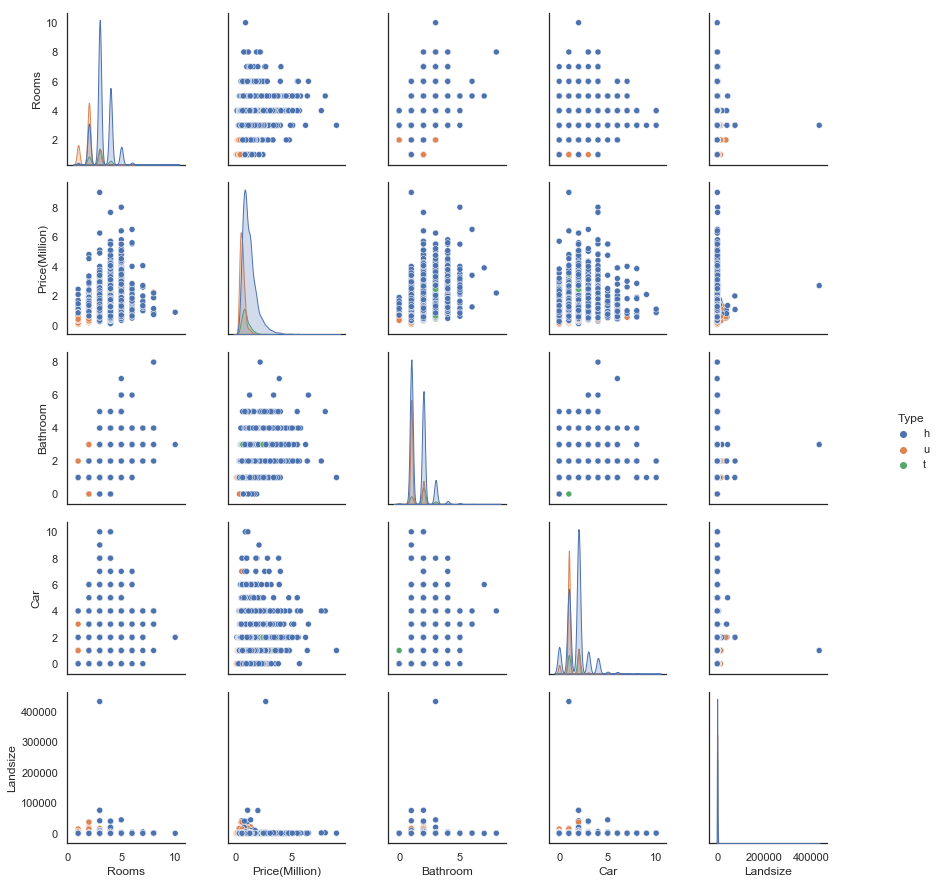

In [52]:
# Use Randomforest regressor 
# I will use Known numerical features, but Randomforest regressor will be affected by noise data, so I firstly check normal distribution
sns.pairplot(house[['Rooms','Price(Million)','Bathroom','Car','Landsize','Type']],hue='Type')

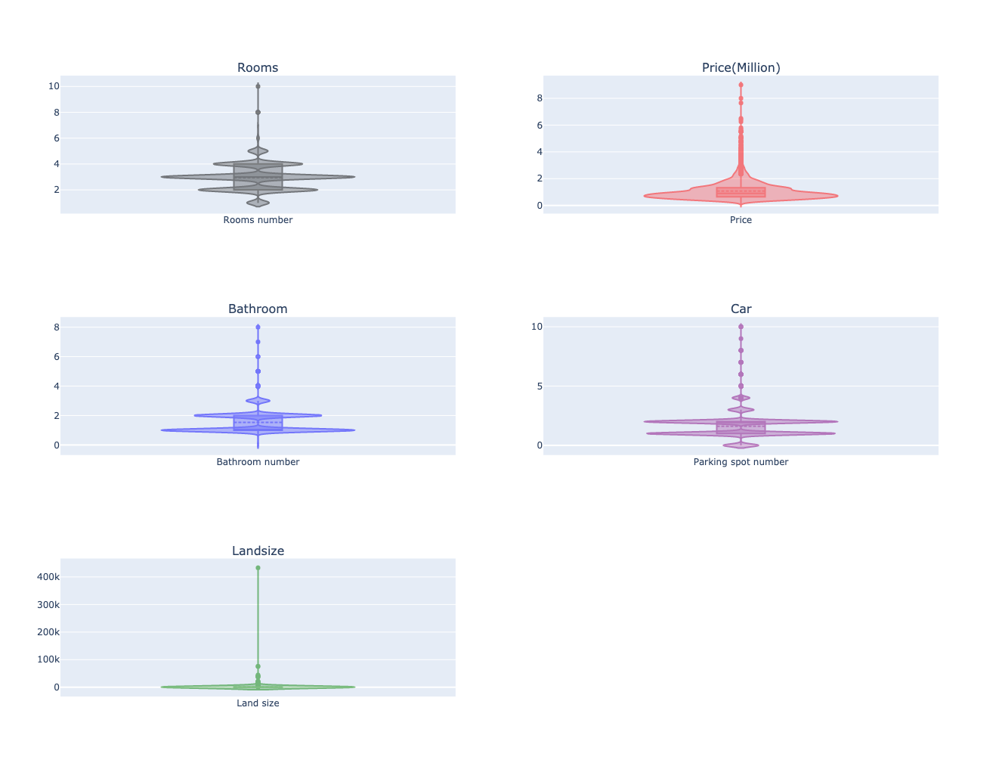

In [53]:
fig_dis = make_subplots(rows=3, cols=2,subplot_titles=('Rooms','Price(Million)','Bathroom','Car','Landsize'))

fig_dis.add_trace(go.Violin(y=house['Rooms'],
                            box_visible=True,
                            meanline_visible=True,
                            line_color='black',
#                             fillcolor='lightseagreen',
                            opacity=0.5,
                            x0='Rooms number'),
              row=1, col=1
             )
fig_dis.add_trace(go.Violin(y=house['Price(Million)'],
                            box_visible=True,
                            meanline_visible=True,
                            line_color='red',
#                             fillcolor='lightseagreen',
                            opacity=0.5,
                            x0='Price'),
              row=1, col=2
             )
fig_dis.add_trace(go.Violin(y=house['Bathroom'],
                            box_visible=True,
                            meanline_visible=True,
                            line_color='blue',
#                             fillcolor='lightseagreen',
                            opacity=0.5,
                            x0='Bathroom number'),
              row=2, col=1
             )
fig_dis.add_trace(go.Violin(y=house['Car'],
                            box_visible=True,
                            meanline_visible=True,
                            line_color='purple',
#                             fillcolor='lightseagreen',
                            opacity=0.5,
                            x0='Parking spot number'),
              row=2, col=2
             )
fig_dis.add_trace(go.Violin(y=house['Landsize'],
                            box_visible=True,
                            meanline_visible=True,
                            line_color='green',
#                             fillcolor='lightseagreen',
                            opacity=0.5,
                            x0='Land size'),
              row=3, col=1
             )


fig_dis.update_layout(showlegend=False,height=1000, width=1000)
fig_dis.show()

In [54]:
# #All having outlier data, but only landsize's outilier is too obvious, I will skip using it. while price feature, I will use shrehold to control some outliers influencing model
# Q1 =house['Price(Million)'].quantile(0.25)
# Q3 = house['Price(Million)'].quantile(0.75)

# IQR = Q3 - Q1

# Upper_Fence = Q3 + (1.5 * IQR)

In [55]:
#transfer non-numeric data columns into numeric type with labelencoder
from sklearn.preprocessing import LabelEncoder

house_label = house.copy()
house_label[['Suburb','Type','SellerG','Regionname']]=house_label[['Suburb','Type','SellerG','Regionname']].apply(LabelEncoder().fit_transform)

In [56]:
house_label.head()

,Suburb,Address,Rooms,Type,Price(Million),SellerG,Date,Postcode,Bedroom2,Bathroom,Car,Landsize,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname
0,0,85 Turner St,2,0,1.480,23,3/12/2016,3067,2.0,1.0,1.0,202.0,NaN,Yarra,-37.7996,144.9984,2
1,0,25 Bloomburg St,2,0,1.035,23,4/02/2016,3067,2.0,1.0,0.0,156.0,1900.0,Yarra,-37.8079,144.9934,2
2,0,5 Charles St,3,0,1.465,23,4/03/2017,3067,3.0,2.0,0.0,134.0,1900.0,Yarra,-37.8093,144.9944,2
3,0,40 Federation La,3,0,0.850,23,4/03/2017,3067,3.0,2.0,1.0,94.0,NaN,Yarra,-37.7969,144.9969,2
4,0,55a Park St,4,0,1.600,153,4/06/2016,3067,3.0,1.0,2.0,120.0,2014.0,Yarra,-37.8072,144.9941,2


In [57]:
# # Upper_Fence
# process_df= house_label[house_label['Price(Million)']<=Upper_Fence][['YearBuilt','Price(Million)','Rooms','Bathroom','Car','Suburb']]

In [58]:
# process_df.shape[0]

In [59]:
# known = process_df[process_df['YearBuilt'].notnull()].as_matrix()
# unknown = process_df[process_df['YearBuilt'].isnull()].as_matrix()

In [60]:
# print(sum(house_label['YearBuilt'].isnull()))
# print(house_label[(house_label['Price(Million)']>Upper_Fence)&(house_label['YearBuilt'].isnull())].shape[0])
# print(unknown.shape[0])

In [61]:
# # X is the value of the feature attribute
# X = known[:, 1:]
# # y is the result tag value
# y = known[:, 0]

In [62]:
# from sklearn.ensemble import RandomForestRegressor

# # fit到RandomForestRegressor之中
# rfr = RandomForestRegressor(random_state=0, n_estimators=1000, n_jobs=-1)
# rfr.fit(X,y)

In [63]:
# # Use the resulting model to predict unknown eigenvalues
# predicted = rfr.predict(unknown[:, 1:])

In [64]:
# # Fill in the missing data with the prediction results
# house.loc[(house['YearBuilt'].isnull()), 'YearBuilt'] = predicted

In [65]:
# # function of printing evaluating dataset accuracy with regression model
# from sklearn import metrics

# def print_evaluate (true,predicted):
#     mae=metrics.mean_absolute_error(true,predicted)
#     mse=metrics.mean_squared_error(true,predicted)
#     rmse=np.sqrt(metrics.mean_squared_error(true,predicted))
#     r2_square=metrics.r2_score(true,predicted)
#     print('MAE:',mae)
#     print('MSE:',mse)
#     print('RMSE:',rmse)
#     print('R Square:',r2_square)

In [66]:
# #use sklearn to manually split train and test data
# from sklearn.model_selection import train_test_split

# x_train, x_test,y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=0)

In [67]:
# evaluate_rfr = RandomForestRegressor(random_state=0, n_estimators=1000, n_jobs=-1)
# evaluate_rfr.fit(x_train,y_train)

In [68]:
# evaluate_predicted = evaluate_rfr.predict(x_test)
# evaluate_predicted_train = evaluate_rfr.predict(x_train)

In [69]:
# print_evaluate(y_train,evaluate_predicted_train)

In [70]:
# print_evaluate(y_test,evaluate_predicted)

In [71]:
# from sklearn.linear_model import LogisticRegression
# lr = LogisticRegression(random_state=0)
# lr.fit(x_train,y_train)

In [72]:
# lr_predicted = lr.predict(x_test)
# lr_predicted_train = lr.predict(x_train)

In [73]:
# from sklearn.metrics import accuracy_score

# def logistic_regression_accuracy(y_train,train_pred,y_test,test_pred):
#     train_accuracy = round(accuracy_score(y_train, train_pred),3)*100
#     print("Train Result:\n================================================")
#     print(f"Accuracy Score: {train_accuracy}%")
  
#     test_accuracy = round(accuracy_score(y_test, test_pred),3)*100
#     print("Test Result:\n================================================")
#     print(f"Accuracy Score: {test_accuracy}%")

In [74]:
# logistic_regression_accuracy(y_train,lr_predicted_train,y_test,lr_predicted)

In [75]:
# from sklearn.linear_model import LinearRegression

# # sklearn lineraregression library to train the model
# lin_reg=LinearRegression(normalize=True,
#                         fit_intercept=True,
#                         copy_X=True,
#                         n_jobs=None)
# lin_reg.fit(x_train,y_train)

In [76]:
# use trained model to predict value
# test_pred = lin_reg.predict(x_test)
# train_pred = lin_reg.predict(x_train)

# print('train set evaluation:\n_____________')
# print_evaluate(y_train,train_pred)
# print('===============')
# print('test set evaluation:\n_____________')
# print_evaluate(y_test,test_pred)

#### choose KNN to fill null value of YearBuilt

In [77]:
process_df= house_label[['YearBuilt','Price(Million)','Rooms','Bathroom','Car','Suburb']]

In [78]:
from sklearn.impute import KNNImputer

# KNN used to fill null value
imputer = KNNImputer(n_neighbors=6,weights='uniform', metric='nan_euclidean')

imputer.fit(process_df.as_matrix())

# transform the dataset
Xtrans = imputer.transform(process_df.as_matrix())

house['YearBuilt'] = Xtrans[:,:1].flatten().round(0).astype(int)

In [79]:
house.shape

(13377, 17)


## CouncilArea      

#### CouncilArea is dependent on suburb and postcode, we have suburb and postcode,so I will delete this column

In [80]:
null(house,'CouncilArea')

% of null: 10.21903266801226%


In [81]:
house.drop('CouncilArea',axis=1,inplace=True)

In [82]:
house.shape

(13377, 16)

## What the trendency of housing rate looks like in Melbourne?
## Which sellerG sell best?

In [83]:
# restore a dataframe including Suburb','Price(Million)','Date','SellerG','Type' so that draw graphs to analyse relationship bewteen time and selling price and selling number
house_rate = house[['Suburb','Price(Million)','Date','SellerG','Type']]
house_rate['Date'] = pd.to_datetime(house_rate['Date'])
house_rate['Num'] = 1

In [86]:
time_price = house_rate[['Date','Price(Million)','Num']].set_index('Date')

In [87]:
# house_rate[['SellMonth','SellYear']]=house_rate['Date'].str.split('-',expand=True)[[0,1]]

In [88]:
# house_rate.drop('Date',axis=1,inplace=True)

In [90]:
# accroding to the same days, calculate everyday's average selling price of real estates and total number of the sold
df_dp = time_price.resample('D').mean().reset_index()
df_numd = time_price.resample('D').sum().reset_index()

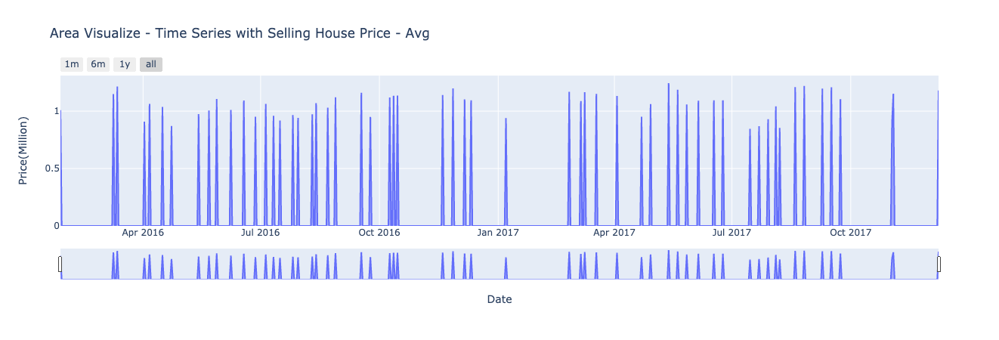

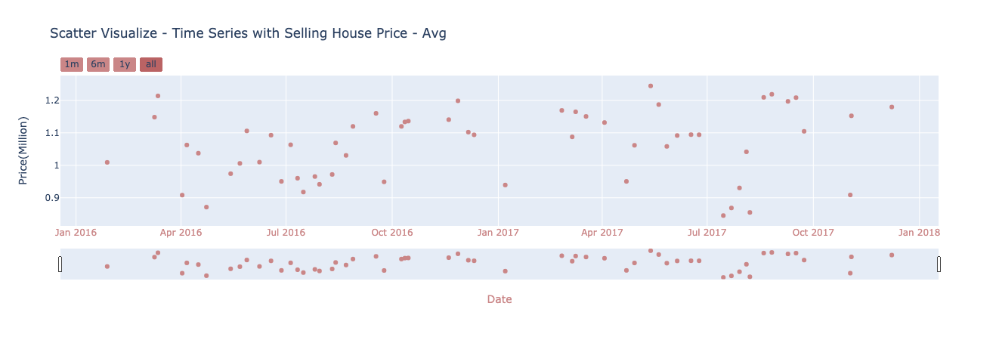

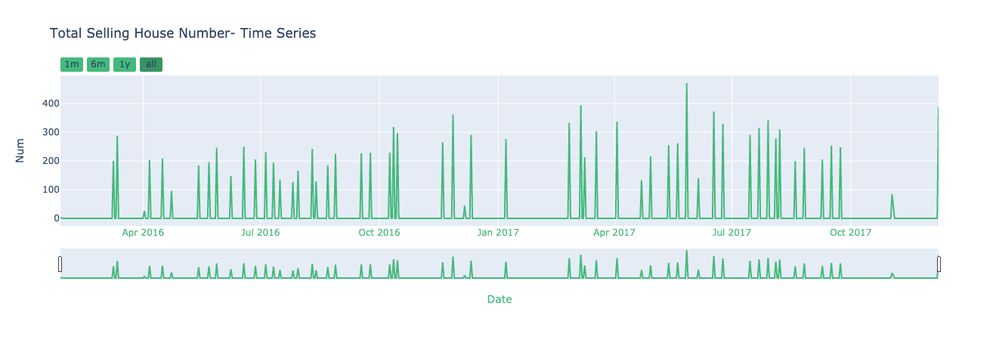

In [91]:
fig_area = px.area(df_dp, x='Date', y='Price(Million)', title='Area Visualize - Time Series with Selling House Price - Avg')

fig_area.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
#             dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
    )
                   

fig_scatter = px.scatter(df_dp, x='Date', y='Price(Million)', title='Scatter Visualize - Time Series with Selling House Price - Avg',color_discrete_sequence=['#ca8687'])

fig_scatter.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(bgcolor='#ca8687',bordercolor='#ca8687',
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
#             dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    ),
#      title_font_color='#ca8687',
    color='#ca8687'    
    )
                   
                   
fig_area.show()
fig_scatter.show()


#number of houses selling
fig_num = px.line(df_numd, x='Date', y='Num', title='Total Selling House Number- Time Series  ',color_discrete_sequence=['#45b97c'])

fig_num.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(bgcolor='#45b97c',bordercolor='#45b97c',
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
#             dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    ),
#      title_font_color='#ca8687',
    color='#45b97c'    
    )


fig_num.show()

In [93]:
# choose the period of time for statistics
period=['10D','3W','m','Q','y']

In [94]:
def draw_avgprice_time(data,period):
    fig, axis = plt.subplots(5, 3, figsize=(30,40))
    color = ['#5c7a29','#5f3c23','#faa755','#bd6758','#d71345']
   
    for i,p in enumerate (period):
        df = data.resample(p).mean().reset_index()
        df_sum = data.resample(p).sum().reset_index()
        df_num = time_price.resample(p).sum().reset_index()

        fig_new = 'fig'+str(i)
        fig_new_sum = 'fig'+str(i)
        
#         axis='ax'+str(i)
        fig_new_sum = sns.lineplot(data=df_sum, x='Date', y='Price(Million)',ax=axis[i,0],color=color[i])
        fig_num = sns.lineplot(data=df_num, x='Date', y='Num',ax=axis[i,1],color=color[i])
        fig_new = sns.lineplot(data=df, x='Date', y='Price(Million)',ax=axis[i,2],color=color[i])


        fig_new.set_title('Average Selling Price ('+ p+')',fontsize=15)
        fig_new_sum.set_title('Sum Selling Price ('+ p+')',fontsize=15)
        fig_num.set_title('Total Num of selling ('+ p+')',fontsize=15)

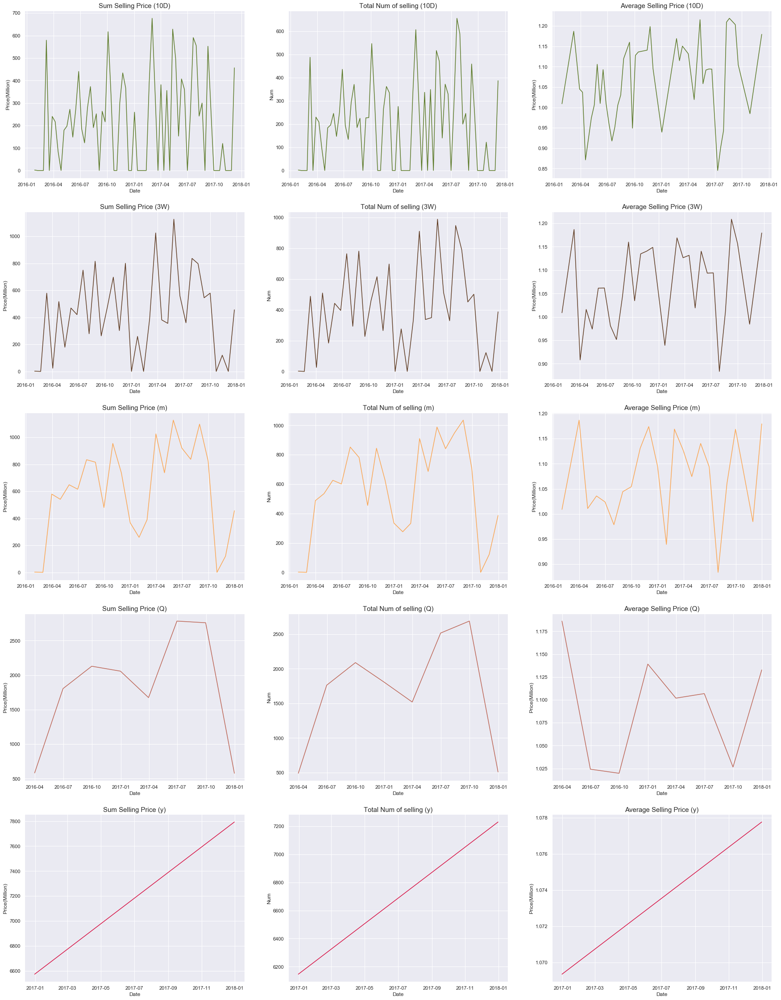

In [96]:
sns.set_theme(style='darkgrid')
draw_avgprice_time(time_price,period)

## Between 2016 and 2017, in one year, whatever in number of house selling or in the price of selling, there is obvious increase trendency

In [97]:
df_year = time_price.resample('Y').sum().reset_index()

In [98]:
# z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')

# fig = go.Figure(data=[go.Surface(z=z_data.values)])

# fig.update_layout(title='Mt Bruno Elevation', autosize=False,
#                   width=500, height=500,
#                   margin=dict(l=65, r=50, b=65, t=90))

# fig.show()

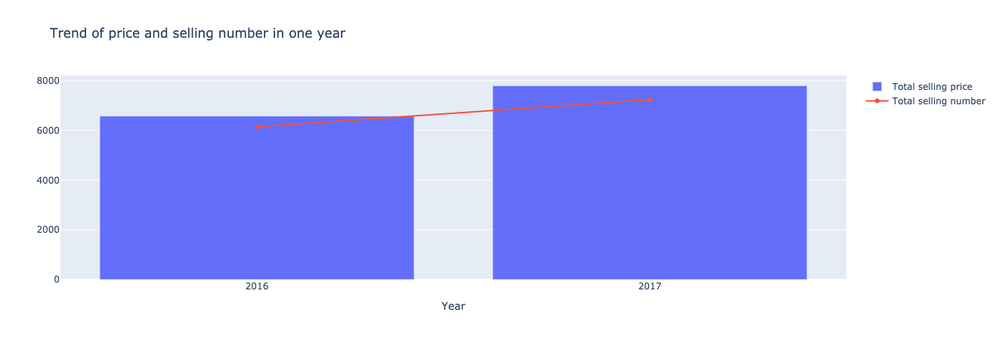

In [101]:
trace_bar=go.Bar(x=df_year['Date'].dt.year.tolist(),y=df_year['Price(Million)'].tolist(),name='Total selling price'
                )

trace_line=go.Line(x=df_year['Date'].dt.year.tolist(),y=df_year['Num'].tolist(),name='Total selling number')

data=[trace_bar,trace_line]

layout= go.Layout(title='Trend of price and selling number in one year',xaxis=dict(title='Year',tickmode='array',tickvals=[2016,2017])
                 )
fig = go.Figure(data,layout)

fig.show()

In [102]:
trendency_price = ((df_year['Price(Million)'][1]-df_year['Price(Million)'][0])/df_year['Price(Million)'][0]) * 100
trendency_num = ((df_year['Num'][1]-df_year['Num'][0])/df_year['Num'][0])*100

print('From 2016 to 2017, the total sum price of selling real estates increases %d' %trendency_price + '%')
print('From 2016 to 2017, the total number of real estates sold increases %d'%trendency_num +'%')


From 2016 to 2017, the total sum price of selling real estates increases 18%
From 2016 to 2017, the total number of real estates sold increases 17%


In [269]:
# get the maximum of the boxplot
def Upper_Fence(df,col):
    Q1 = df[col].quantile(0.25)
    Q3= df[col].quantile(0.75)

    IQR = Q3 - Q1

    Upper_Fence = Q3 + (1.5 * IQR)
    return Upper_Fence


In [271]:
Upper = Upper_Fence(time_price,'Price(Million)')

2.34375

In [114]:
df_Upper_Fence = time_price[time_price['Price(Million)']>=Upper].reset_index().sort_values(by='Date')

These dates are not holidays which may affect selling prices.


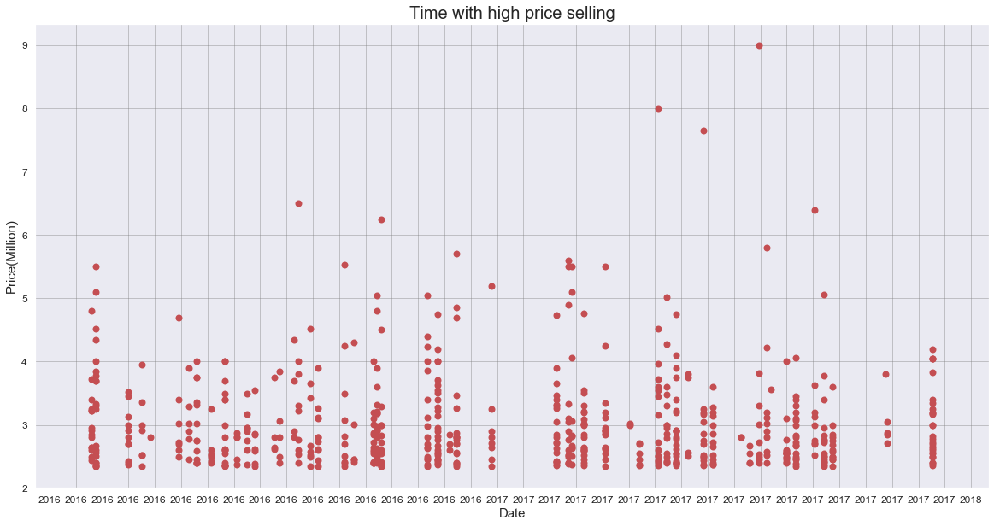

In [159]:
from datetime import date
import holidays
import matplotlib.ticker as ticker

# Select country
AU_holidays = holidays.AU(prov='VIC')


fig,ax=plt.subplots(figsize=(20,10))

x= df_Upper_Fence['Date']
y=df_Upper_Fence['Price(Million)']

ax.scatter(x,y,c='r',lw=2,marker='o')


ax.xaxis.set_major_locator(ticker.MultipleLocator(base=20)) #set aixs intervals,let xticks value not too filled
ax.grid(linestyle = '-',linewidth =1, color= 'gray',alpha = 0.4) 
# ax.patch.set_facecolor("")  
ax.set_title('Time with high price selling',fontsize=20)
ax.set_ylabel('Price(Million)',fontsize=15)
ax.set_xlabel('Date',fontsize=15)
ax.tick_params(labelsize=12)
style = dict(size=15, color='black')

# tell whether there is some day is holiday that cause selling price is high
n=0
for i in x.dt.date:
    if i not in AU_holidays:
        continue
    elif i in AU_holidays:
        ax.annotate(AU_holidays.get(i)+' ('+i+')',xy=(i,list(y)[x.dt.date.index(i)]),xycoords='data',xytext=(50,200),rotation=15,size=13,
                    textcoords='offset points', arrowprops=dict(arrowstyle="->",connectionstyle="arc3,rad=-0.2",color='black'),
                    bbox=dict(pad=0, facecolor="none", edgecolor="none"))
        n+=1

if n == 0:
    print('These dates are not holidays which may affect selling prices.' )
    



## These are general trends of situation in real estatas selling in Melbourne.

I will focus on different types of real estates, different agencies and different suburbs ro analysis price trends.

In [164]:
house_type=house[['Type','Rooms','SellerG','Date','Bedroom2','Bathroom','Car','Landsize','YearBuilt','Price(Million)']]
house_type['Date'] = pd.to_datetime(house_type['Date'])

In [167]:
house_type['Age(Years)']=(house_type['Date'].dt.year)-house_type['YearBuilt']

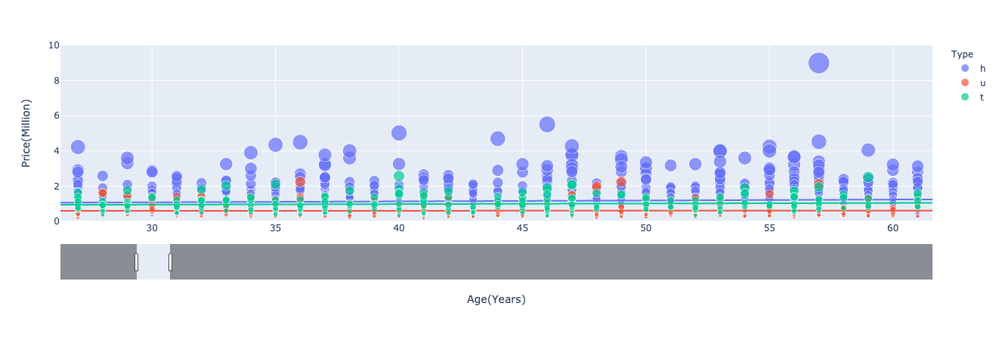

In [192]:
## relationships between the age of real estates and selling prices
fig_age = px.scatter(house_type, x='Age(Years)', y='Price(Million)', color='Type',
                     size='Price(Million)', hover_data=['Price(Million)','Age(Years)','Rooms','Bedroom2','Bathroom','Car','Landsize','YearBuilt'],trendline="ols",
                     range_x=[-10,850], range_y=[0,10],
                   )

# fig_age['layout'].pop('updatemenus')
fig_age.update_layout(xaxis=dict(
                        rangeslider=dict(visible=True)
                    ),
                     dragmode="zoom"
                     )
fig_age.show()

In [193]:
house_type[house_type['Age(Years)']<0]

,Type,Rooms,SellerG,Date,Bedroom2,Bathroom,Car,Landsize,YearBuilt,Price(Million),Age(Years)
441,t,3,Nelson,2016-03-12,3.0,3.0,1.0,557.0,2017,0.8510,-1
3489,h,3,Nelson,2016-04-23,3.0,2.0,1.0,630.0,2017,0.8250,-1
5153,h,4,Barry,2016-09-17,3.0,2.0,2.0,834.0,2017,0.7675,-1


### From the graph above, there is a problem, where 3 realestates were sold before they were built, we named it as preselling products. As the number of this problem is small, we can ignore it. (Note: there is on house whose age is 821, outlier, I should notice this when using machine learning to predict price.)

### From the graph above, obviousely, the selling prices of houses are generally higher than that of units and tolls. From the three lines, the general selling prices of tolls are higher than that of tolls. To verify this phenomenon, I will calculate each type's selling number and avagerage/total prices of real estates.

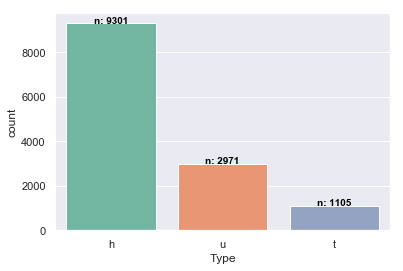

In [228]:
ax = sns.countplot(house_type['Type'], palette='Set2')

sums = house_type.groupby(['Type'])['Type'].sum().values
nobs = house_type['Type'].value_counts().values
nob_num = [str(x) for x in nobs.tolist()]
nob = ["n: " + i for i in nob_num]

pos = range(len(nob))
for tick,label in zip(pos,ax.get_xticklabels()):
    ax.text(pos[tick], nobs[tick] + 0.06, nob[tick], horizontalalignment='center', size='small', color='black', weight='semibold')

### House is the most popular type of real estate 

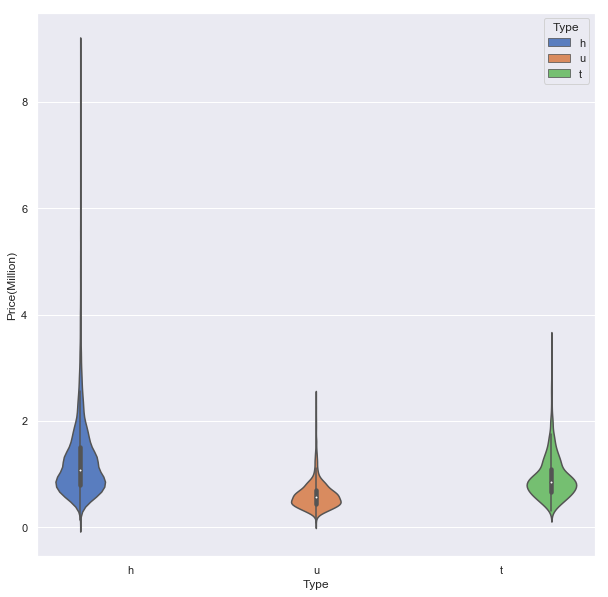

In [238]:
fig_type, ax_type = plt.subplots(figsize=(10,10))
ax_type=sns.violinplot(x=house_type['Type'],y=house_type['Price(Million)'],hue=house_type['Type'],palette="muted")


### From Violin graph, it is verified that the selling prices of house is higher than that of tolls which is higher than that of units.

### To analyse whether landsize, age, rooms will affect selling price, from the last scatter pair plot graph, we can find there is only one relationship between rooms and bathrooms, if rooms are more , there is more likely to have more bathrooms.

In [263]:
# fig_ru = px.scatter(house_type[house_type['Type']=='u'], x='Rooms', y='Landsize',
#                      size='Landsize', hover_data=['Price(Million)','Age(Years)','Rooms','Bedroom2','Bathroom','Car','Landsize','YearBuilt']
#                    )
# fig_ru.show()

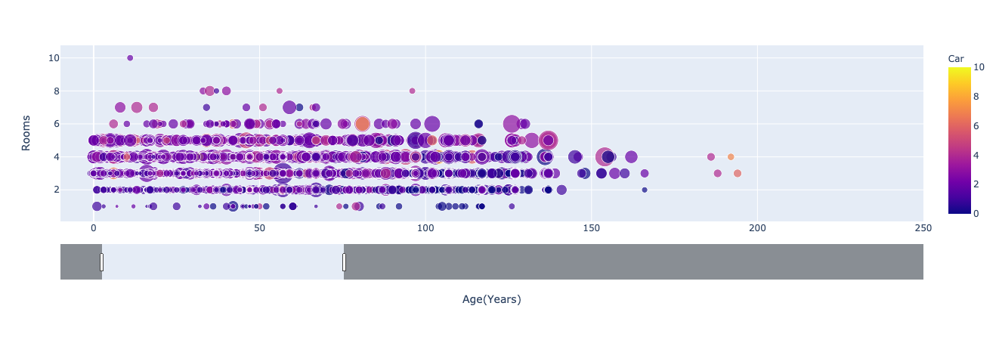

In [253]:
fig_hr = px.scatter(house_type[house_type['Type']=='h'], x='Age(Years)', y='Rooms', color='Car',
                     size='Price(Million)', hover_data=['Price(Million)','Age(Years)','Rooms','Bedroom2','Bathroom','Car','Landsize','YearBuilt'],
                     range_x=[-10,250]
                   )

fig_h.update_layout(xaxis=dict(
                        rangeslider=dict(visible=True)
                    ),
                     dragmode="zoom"
                     )
fig_h.show()


In [272]:
upper_land = Upper_Fence(house_type,'Landsize')
upper_age = Upper_Fence(house_type,'Age(Years)')

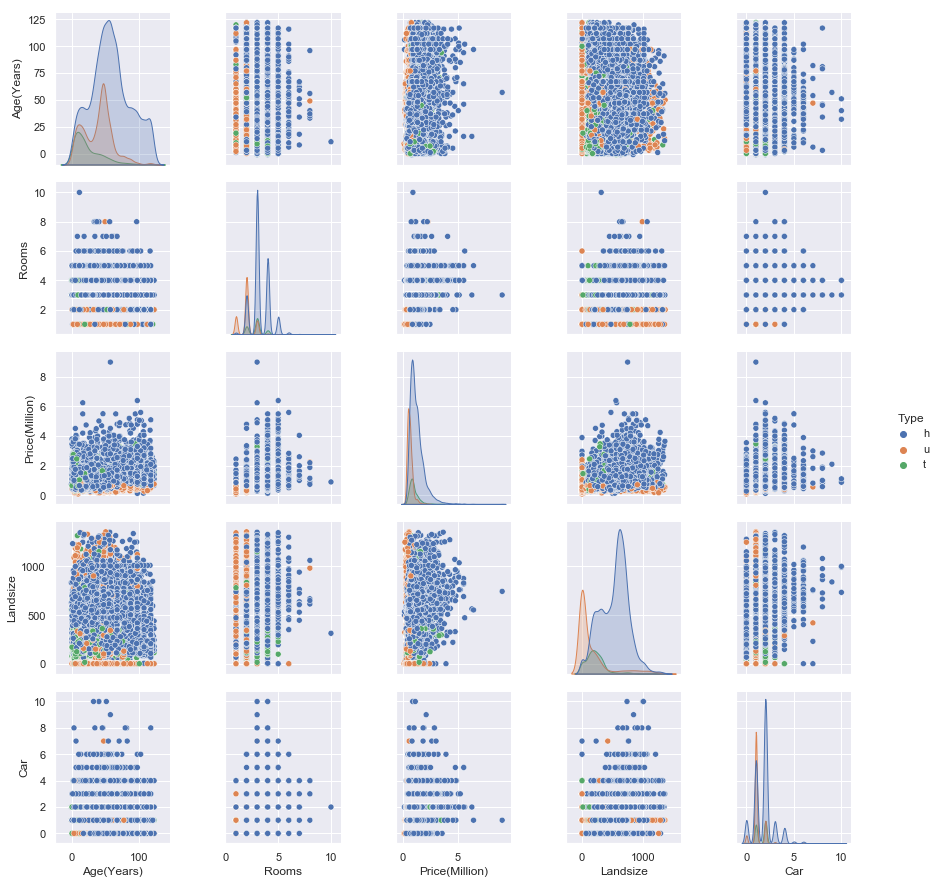

In [274]:
sns.pairplot(house_type[(house_type['Landsize']<upper_land) & (house_type['Age(Years)']<upper_age)][['Age(Years)','Rooms','Price(Million)','Landsize','Type','Car']],hue='Type')

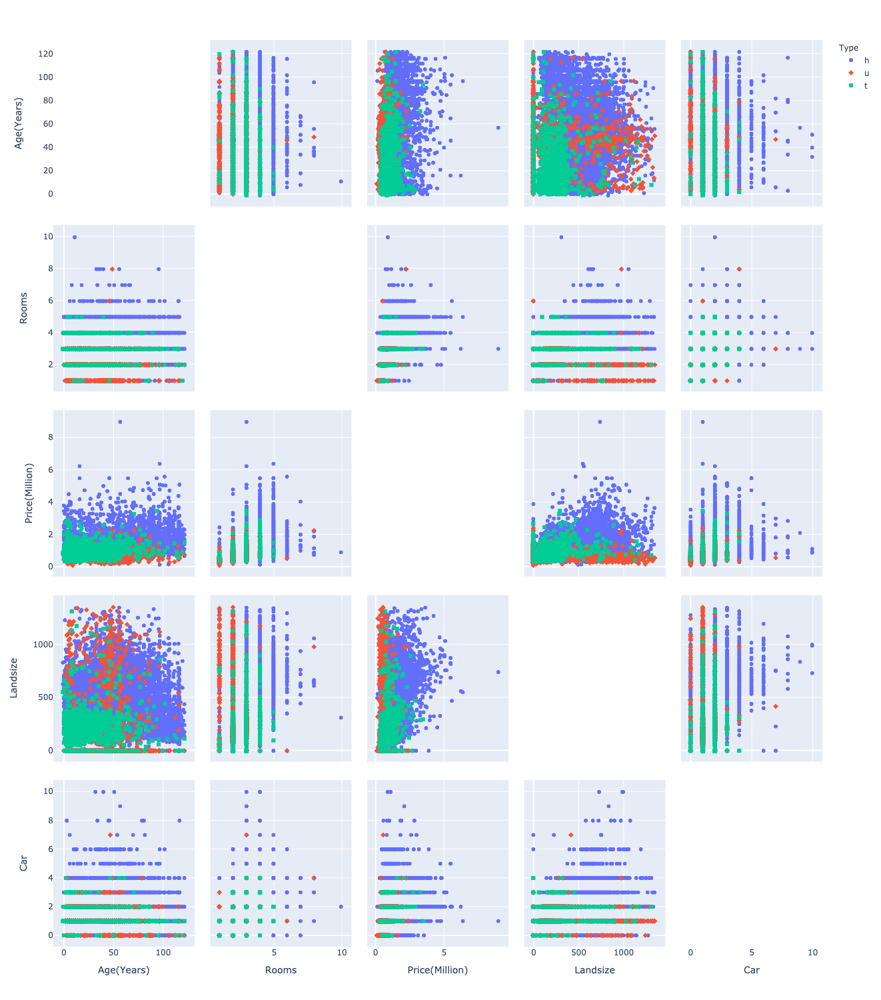

In [294]:
fig_scat_matr = px.scatter_matrix(house_type[(house_type['Landsize']<upper_land) & (house_type['Age(Years)']<upper_age)][['Age(Years)','Rooms','Price(Million)','Landsize','Type','Car']],
                                  dimensions=['Age(Years)','Rooms','Price(Million)','Landsize','Car'],
                                  symbol='Type',
                                  color="Type",
                                  )

fig_scat_matr.update_layout(
                  width=1300,
                  height=1500,
                  )
fig_scat_matr.update_traces(diagonal_visible=False)

fig_scat_matr.show()

In [ ]:
SellerG